1. Import data

In [2]:
import pandas as pd
import os

dir_path = '/kaggle/input/datasets/deveshppawar/comsol-data'

rows = []
for root, _, filenames in os.walk(dir_path):
    for file in filenames:
        if file.endswith('.csv') and file.startswith('data_t'):
            print(file)
            t = float(file.split('_t')[1].split('.')[0])
            df = pd.read_csv(os.path.join(root, file), sep=';')
            df_actual = df[7:]
            for i in range(len(df_actual)):
                rows.append(list(map(float, df_actual.iloc[i].values[0].split(","))) + [t])

X = pd.DataFrame(rows, columns=['x', 'y', 'z', 'temp', 't'])

""" add steady state solution with t=100s """
u_steady = pd.read_csv(os.path.join(dir_path, 'data_steady.csv'), sep=';')
u_actual = u_steady[7:]
rows_s = []
for i in range(len(u_actual)):
    rows_s.append(list(map(float, u_actual.iloc[i].values[0].split(","))) + [100.0])
X_s = pd.DataFrame(rows_s, columns=['x', 'y', 'z', 'temp', 't'])

X = pd.concat([X, X_s], ignore_index=True)
X.tail()


data_t1.csv
data_t5.csv
data_t8.csv
data_t3.csv
data_t10.csv
data_t4.csv
data_t7.csv
data_t6.csv
data_t2.csv
data_t9.csv


,x,y,z,temp,t
47141,0.008258,0.013053,0.000000,368.811663,100.0
47142,0.013782,0.017265,0.000000,369.704690,100.0
47143,0.000000,0.027975,0.040996,372.437831,100.0
47144,0.086667,0.000000,0.000000,367.728825,100.0
47145,0.000000,0.011075,0.004278,368.374155,100.0


2. Training data

In [3]:
import numpy as np

# thermal params
rho = 15.0
cp = 200.0
h = 15.0
q_flux = 2000.0
T_inf = 300.0
seed = 42
n_sensors = 20
kx = 41. 
ky = 7. 
kz = 41.

# pielm.train(nx=nx, ny=ny, nz=nz, nt=nt, x_max=x_max, y_max=y_max,
            # z_max=x_max, t_min=t_min, t_max=t_max, kx=kx, ky=ky, kz=kz,
            # h=h, q_flux=q_flux, T_inf=T_inf, rho=rho, cp=cp, T_initial=T_initial, seed=42)
# PIELM hyperparams params
hidden_nodes = 1000
nx = 30 
ny = 30
nz = 30
nt = len(np.unique(X['t']))
x_max= 0.2
y_max = 0.05
z_max = 0.25
t_min = np.min(X['t']) 
t_max = np.max(X['t'])
T_initial = 300.0 


In [4]:
import numpy as np
T_data = X['temp'].values
X_data = X[['x', 'y', 'z', 't']].values
t_unique = np.unique(X.iloc[:, 4])

rng = np.random.RandomState(seed)
xyz = X.iloc[:, :3]
unique_xyz, inverse = np.unique(xyz, axis=0, return_inverse=True)

n_sensors = min(n_sensors, unique_xyz.shape[0])
sensor_loc_idx = rng.choice(unique_xyz.shape[0], size=n_sensors, replace=False)

sensor_mask = np.isin(inverse, sensor_loc_idx)
X_train = X_data[sensor_mask]
T_train = T_data[sensor_mask]

X_test, T_test = X_data[~sensor_mask], T_data[~sensor_mask]

3. PIELM Class


In [5]:

# Chebyshev interior collocation, clusters near boundaries
def cheby(n, lo, hi):
    k = np.arange(1, n + 1)
    return np.sort(0.5*(lo+hi) + 0.5*(hi-lo)*np.cos(np.pi*(2*k-1)/(2*n)))

class PIELM:

    def __init__(self, hidden_nodes=1800):
        self.N  = hidden_nodes
        self.W  = self.b = self.c = None
        self.kx  = None
        self.ky = None 
        self.kz = None   
        self.rho = None 
        self.cp = None

    def _phi(self, z):
        return np.tanh(z)
    
    def _phi_p(self, z):
        return 1.0 - np.tanh(z)**2
    
    def _phi_pp(self, z):
        t = np.tanh(z)
        return -2.0*t*(1.0 - t**2)

    def _z(self, X):   
        return X @ self.W.T + self.b.T
    
    def _H(self, X):
        return self._phi(self._z(X))

    def _H_dn(self, X, axis):
        return self._phi_p(self._z(X)) * self.W[:, axis]

    def _H_dx(self, X):
        return self._H_dn(X, 0)

    def _H_dy(self, X):
        return self._H_dn(X, 1)

    def _H_dz(self, X):
        return self._H_dn(X, 2)

    def _H_pde(self, X):
        z = self._z(X)
        phi_p = self._phi_p(z)
        phi_pp = self._phi_pp(z)
        H_lap = phi_pp * (self.kx*self.W[:, 0]**2 + self.ky*self.W[:, 1]**2 + self.kz*self.W[:, 2]**2)
        H_t = phi_p  * self.rho * self.cp * self.W[:, 3]
        return H_lap -  H_t # as there is no q (internal heat gen)

    def _face_points(self, axis, coord, grid_a, grid_b, ti):
        free_axes = [a for a in (0, 1, 2) if a != axis]
        Ga, Gb = np.meshgrid(grid_a, grid_b)
        pts = np.zeros((Ga.size, 4))
        pts[:, free_axes[0]] = Ga.ravel()
        pts[:, free_axes[1]] = Gb.ravel()
        pts[:, axis] = coord
        pts[:, 3] = ti
        return pts

    @staticmethod
    def _weighted_block(H_block, K_block, weight, power=0.5):
        # Rescale a whole equation-type block by weight / n_rows**power.
        # power=0.5 (default) makes a block's contribution to the total
        # sum-of-squares independent of its row count -- refining a grid
        # (more PDE/BC/IC points) then no longer silently changes that
        # block's relative importance. power=1.0 is also exposed so you
        # can empirically compare against a stronger row-count penalty,
        # but note it makes a block matter LESS the more finely you
        # sample it, which is generally not what you want as you refine.
        n = H_block.shape[0]
        scale = weight / (n ** power)
        return H_block * scale, K_block * scale

    def train(self, nx=40, ny=40, nz=40,  nt=11, x_max=0.2, y_max=0.05, z_max=0.25,  t_min=0.0,  t_max=100.0, kx=41., ky=7., kz=41., h=25., q_flux=500., T_inf=22.,
              rho=7850., cp=434., T_initial=22., seed=42,
              X_data_fit=None, T_data_fit=None,
              w_pde=1.0, w_bc=1.0, w_ic=1.0, w_data=5.0, block_norm_power=0.5,
              frac_fast_time=0.5, t_char=None, verbose=True):

        self.kx = kx
        self.ky = ky 
        self.kz = kz 
        self.rho = rho 
        self.cp = cp
        k_vals = [kx, ky, kz]

        sx = 2.0*np.sqrt(3.0) / x_max
        sy = 2.0*np.sqrt(3.0) / y_max
        sz = 2.0*np.sqrt(3.0) / z_max
        st_domain = 2.0*np.sqrt(3.0) / max(t_max - t_min, 1e-6)

        # --- Mixed-timescale time features -----------------------------
        # The old code drew EVERY hidden unit's time-frequency from a band
        # tied only to the full domain span (t_max - t_min), so none of
        # them had the bandwidth to represent variation faster than that.
        # If the physical diffusion timescale (tau = L^2/alpha) is much
        # shorter than the domain span -- very likely here, since the slab
        # equilibrates in a few seconds but the domain runs to 100s -- no
        # amount of loss/row reweighting can fix that; the basis itself is
        # too smooth in time. So a fraction of hidden units get a second,
        # much higher time-frequency band tied to tau instead.
        if t_char is None:
            alpha_x, alpha_y, alpha_z = kx/(rho*cp), ky/(rho*cp), kz/(rho*cp)
            t_char = min(x_max**2/alpha_x, y_max**2/alpha_y, z_max**2/alpha_z)
        st_fast = 2.0*np.sqrt(3.0) / max(t_char, 1e-6)
        if verbose:
            print(f"Characteristic diffusion time tau ~ {t_char:.3f}s "
                  f"(domain span {t_max - t_min:.1f}s) -> "
                  f"{frac_fast_time*100:.0f}% of hidden units get fast "
                  f"time-frequency features tied to tau")

        best_cond, best_W, best_b = np.inf, None, None
        for s in range(seed, seed + 5):
            np.random.seed(s)
            n_fast = int(round(self.N * frac_fast_time))
            Wt = np.concatenate([
                np.random.uniform(-st_domain, st_domain, self.N - n_fast),
                np.random.uniform(-st_fast, st_fast, n_fast),
            ])
            np.random.shuffle(Wt)
            W_ = np.column_stack([np.random.uniform(-sx, sx, self.N),
                np.random.uniform(-sy, sy, self.N),
                np.random.uniform(-sz, sz, self.N),
                Wt,
            ])
            b_ = np.random.uniform(-1.0, 1.0, (self.N, 1))
            Xs = np.random.rand(100, 4)
            Xs[:,0] *= x_max
            Xs[:,1] *= y_max
            Xs[:,2] *= z_max
            Xs[:,3] = np.random.rand(100)*(t_max - t_min) + t_min
            cond = np.linalg.cond(np.tanh(Xs @ W_.T + b_.T))
            if cond < best_cond:
                best_cond, best_W, best_b = cond, W_, b_
        self.W, self.b = best_W, best_b
        if verbose:
            print(f"Condition number: {best_cond}")

        xc = cheby(nx, 0.0, x_max)
        yc = cheby(ny, 0.0, y_max)
        zc = cheby(nz, 0.0, z_max)

        tc = cheby(nt, t_min, t_max)

        Xg, Yg, Zg, Tg = np.meshgrid(xc, yc, zc, tc)
        X_phys = np.column_stack((Xg.ravel(), Yg.ravel(), Zg.ravel(),  Tg.ravel()))

        H_pde = self._H_pde(X_phys)
        K_pde = np.zeros((len(X_phys), 1))

        # --- Boundary conditions -------------------------------------------
        face_specs = [
            ('neumann_flux', 1, y_max, -1.0),   # y = y_max  (flux)
            ('convection',   1, 0.0,   1.0),    # y = 0
            ('convection',   0, 0.0,   1.0),    # x = 0
            ('convection',   0, x_max, -1.0),   # x = x_max
            ('convection',   2, 0.0,   1.0),    # z = 0
            ('convection',   2, z_max, -1.0),   # z = z_max
        ]
        dH = [self._H_dx, self._H_dy, self._H_dz]

        n_bc = max([nx, ny, nz]) * 2
        edges = {
            0: np.linspace(0.0, x_max, n_bc),
            1: np.linspace(0.0, y_max, n_bc),
            2: np.linspace(0.0, z_max, n_bc),
        }
        t_e = np.linspace(t_min, t_max, nt + 2)

        rows_H, rows_K = [], []
        for ti in t_e:
            for bc_type, axis, coord, face_sign in face_specs:
                free_axes = [a for a in (0, 1, 2) if a != axis]
                X_face = self._face_points(axis, coord, edges[free_axes[0]], edges[free_axes[1]], ti)
                k_n = k_vals[axis]
                dT_dn = dH[axis](X_face)

                if bc_type == 'neumann_flux':
                    rows_H.append(face_sign * k_n * dT_dn)
                    rows_K.append(np.full((len(X_face), 1), -q_flux))
                elif bc_type == 'convection':
                    rows_H.append(face_sign * k_n * dT_dn - h * self._H(X_face))
                    rows_K.append(np.full((len(X_face), 1), -h * T_inf))
                else:
                    raise ValueError(f'Unknown boundary condition: {bc_type}')

        H_bc_all = np.vstack(rows_H)
        K_bc_all = np.vstack(rows_K)

        # IC rows 
        xc_ic = np.linspace(0.0, x_max, nx)
        yc_ic = np.linspace(0.0, y_max, ny)
        zc_ic = np.linspace(0.0, z_max, nz)
        Xg_ic, Yg_ic, Zg_ic = np.meshgrid(xc_ic, yc_ic, zc_ic)
        X_ic = np.column_stack((Xg_ic.ravel(), Yg_ic.ravel(), Zg_ic.ravel(), np.full(Xg_ic.size, t_min)))
        H_ic = self._H(X_ic)
        T_ic_raw = np.full(len(X_ic), float(T_initial))
        K_ic = T_ic_raw.reshape(-1, 1)

        H_pde_w, K_pde_w = self._weighted_block(H_pde, K_pde, w_pde, block_norm_power)
        H_bc_w,  K_bc_w  = self._weighted_block(H_bc_all, K_bc_all, w_bc, block_norm_power)
        H_ic_w,  K_ic_w  = self._weighted_block(H_ic, K_ic, w_ic, block_norm_power)

        H_blocks = [H_pde_w, H_bc_w, H_ic_w]
        K_blocks = [K_pde_w, K_bc_w, K_ic_w]

        H_data = K_data = None
        if X_data_fit is not None and T_data_fit is not None:
            H_data = self._H(X_data_fit)
            K_data = T_data_fit.reshape(-1, 1)
            H_data_w, K_data_w = self._weighted_block(H_data, K_data, w_data, block_norm_power)
            H_blocks.append(H_data_w)
            K_blocks.append(K_data_w)

        H = np.vstack(H_blocks)
        K = np.vstack(K_blocks)

        self.c, _, rank, sv = np.linalg.lstsq(H, K, rcond=None)

        if verbose:
            # Raw (unweighted) RMS residual per block, using the already-
            # solved c -- shows which equation type is actually well
            # satisfied vs. poorly satisfied, independent of the w_*
            # weights used to build the solve. A block with a much smaller
            # RMS than the others is a sign it's being over-satisfied
            # relative to the rest (candidate for lowering its weight);
            # a much larger RMS is under-satisfied (candidate for raising).
            def _rms(Hb, Kb):
                r = Hb @ self.c - Kb
                return float(np.sqrt(np.mean(r**2)))
            msg = (f"Raw residual RMS -> pde: {_rms(H_pde, K_pde):.3f} | "
                   f"bc: {_rms(H_bc_all, K_bc_all):.3f} | "
                   f"ic: {_rms(H_ic, K_ic):.3f}")
            if H_data is not None:
                msg += f" | data: {_rms(H_data, K_data):.3f}"
            print(msg)

        return self
 
    def predict(self, X):
        return (self._H(X) @ self.c).ravel()


4. Params

5. Train and plot

In [6]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

pielm = PIELM(hidden_nodes=hidden_nodes)
pielm.train(nx=nx, ny=ny, nz=nz, nt=nt, x_max=x_max, y_max=y_max,
            z_max=z_max, t_min=0.0, t_max=t_max, kx=kx, ky=ky, kz=kz,
            h=h, q_flux=q_flux, T_inf=T_inf, rho=rho, cp=cp, T_initial=T_initial,
            seed=42, X_data_fit=X_train, T_data_fit=T_train,
            w_pde=1.0, w_bc=1.0, w_ic=1.0, w_data=5.0,
            frac_fast_time=0.5)
# New: `frac_fast_time` gives half the hidden units time-frequency content
# tied to the physical diffusion timescale (tau), not just the full [0,100]s
# domain span -- this is what should let predictions actually change across
# your 11 time snapshots. Watch the printed "Raw residual RMS" line: if
# ic's RMS is much smaller than pde/bc's, that's direct evidence IC is
# currently over-weighted relative to them, and w_ic should come down.

T_pred = pielm.predict(X_data)

# Metrics on ALL points (train sensors + held-out), for reference only --
# this mixes points the model was fit to with points it wasn't.
print(f"[All points] MSE: {mean_squared_error(T_data, T_pred):.4f} | MAE: {mean_absolute_error(T_data, T_pred):.4f}")

# Metrics on the held-out TEST set only -- this is the number that actually
# reflects generalization, since these points never entered the fit.
T_pred_test = pielm.predict(X_test)
print(f"[Test only]  MSE: {mean_squared_error(T_test, T_pred_test):.4f} | MAE: {mean_absolute_error(T_test, T_pred_test):.4f}")


Characteristic diffusion time tau ~ 1.071s (domain span 100.0s) -> 50% of hidden units get fast time-frequency features tied to tau
Condition number: 2602.9928541459494
Raw residual RMS -> pde: 291.822 | bc: 372.415 | ic: 8.215 | data: 13.825
[All points] MSE: 193.2163 | MAE: 11.0783
[Test only]  MSE: 193.2261 | MAE: 11.0786


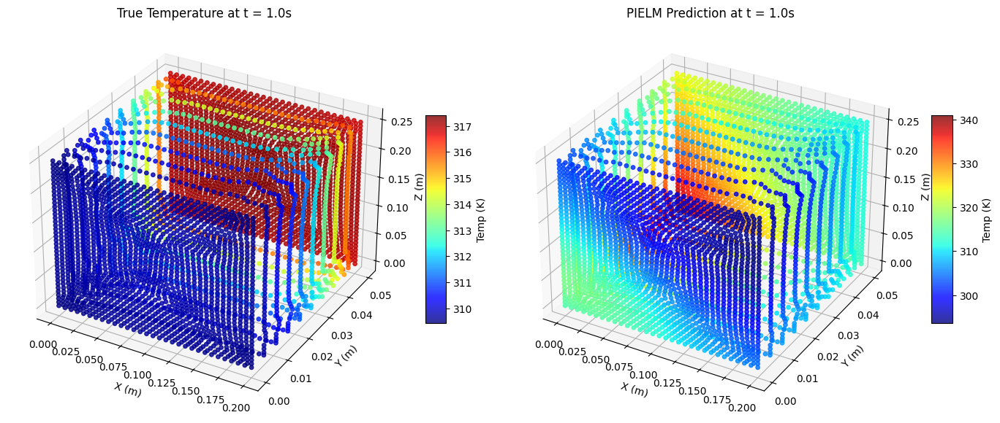

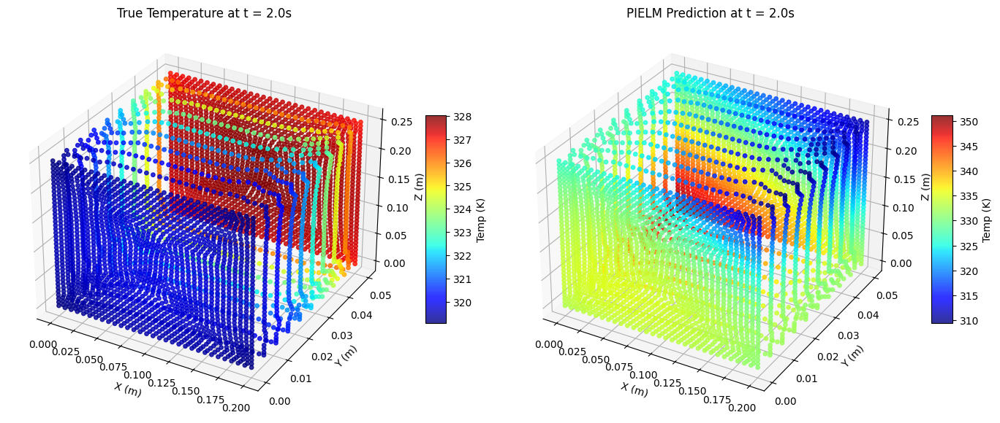

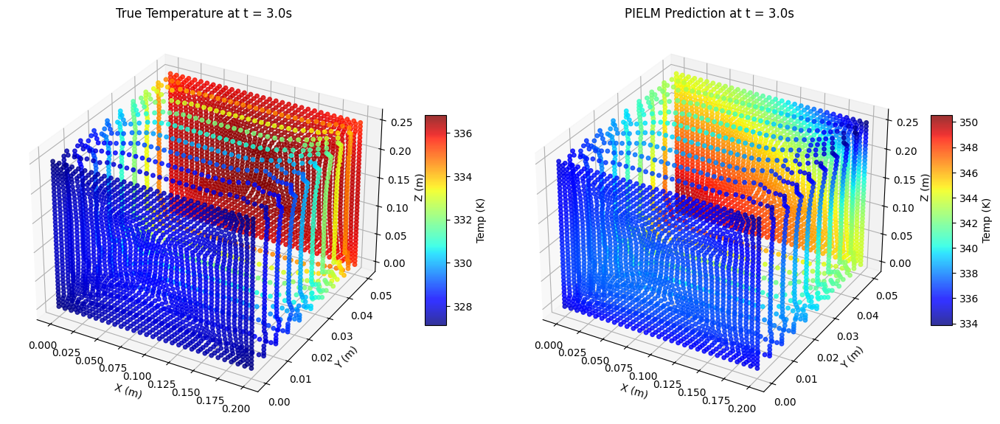

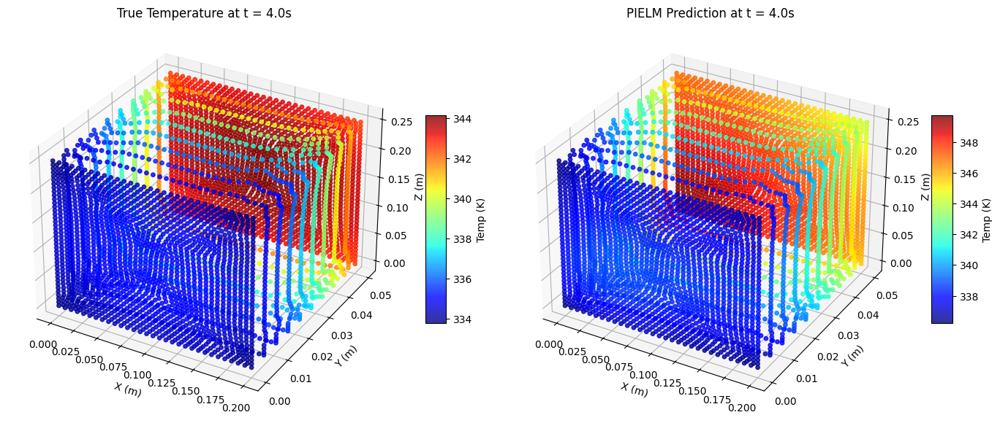

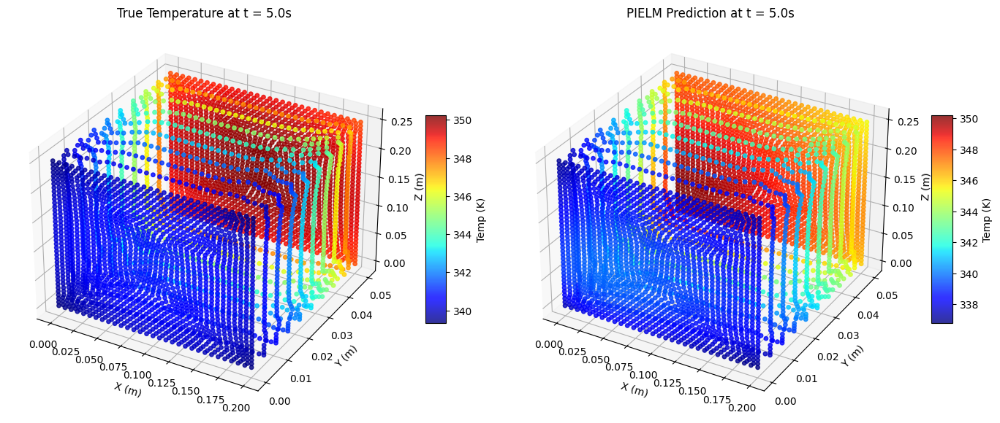

...

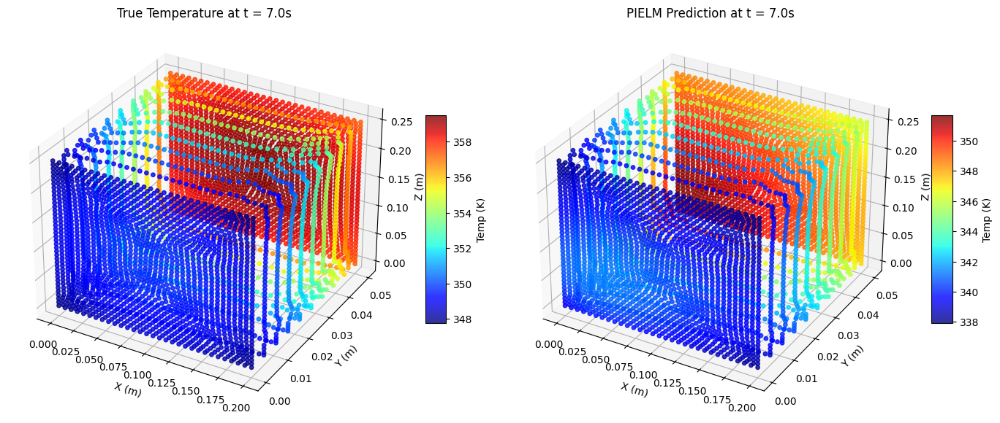

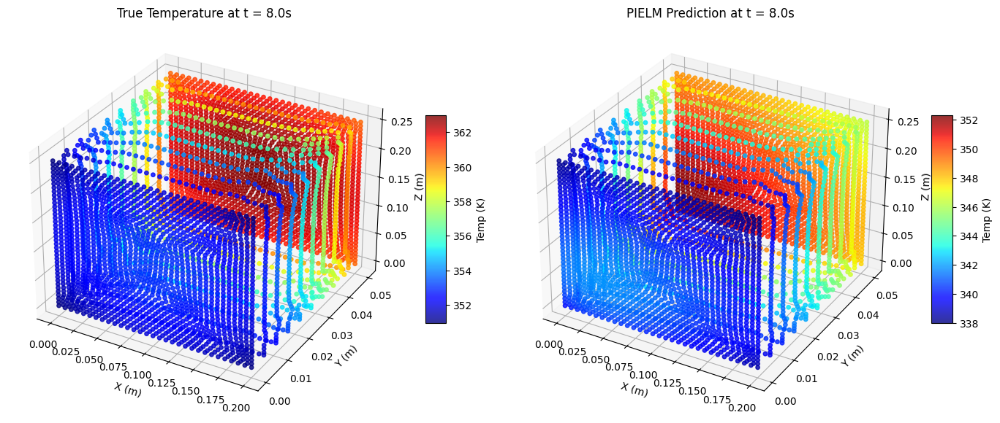

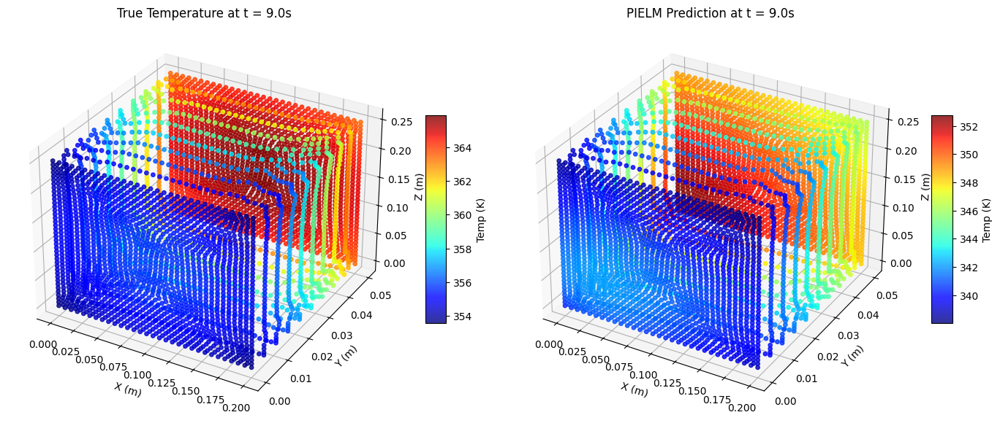

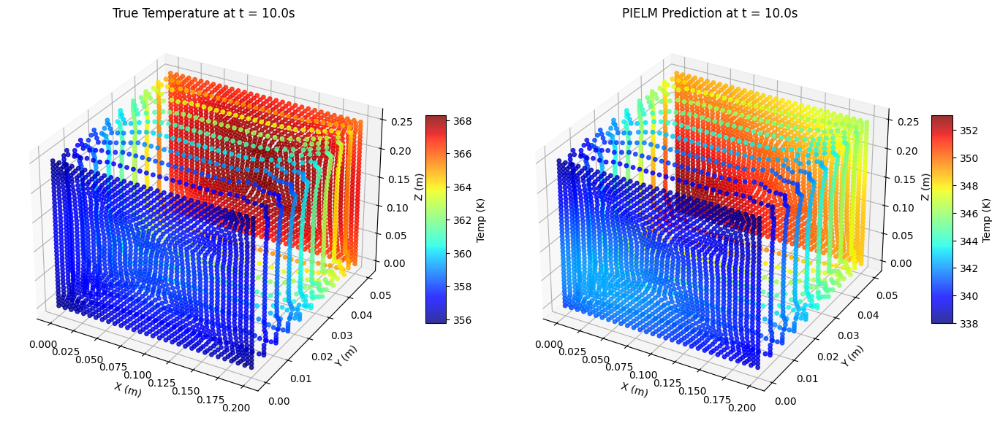

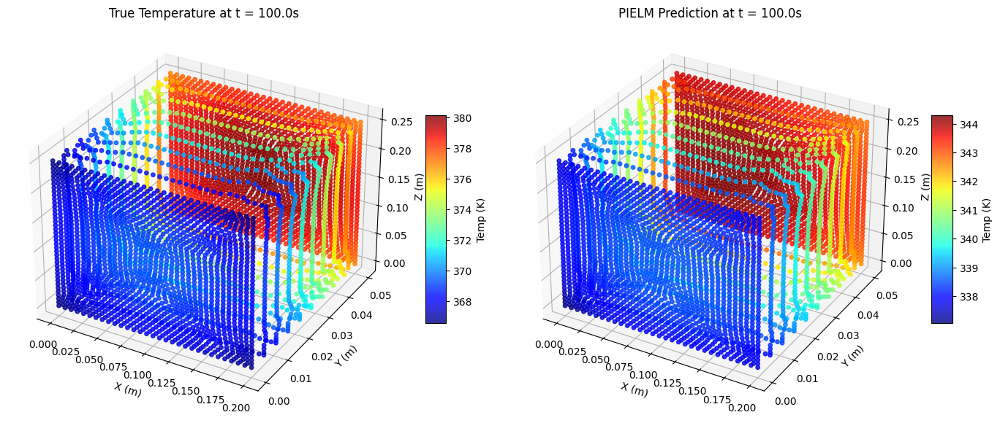

In [7]:
import matplotlib.pyplot as plt

# Fixed: X_data is a NumPy array, so X_data['t'] (pandas-style column
# indexing) raised a TypeError; and range(np.unique(...)) doesn't make
# sense on an array of time values. Iterate the actual time values instead.
for time in np.unique(X_data[:, 3]):
    fig = plt.figure(figsize=(14, 6))

    mask = (X_data[:, 3] == time)
    X_slab = X_data[mask]
    T_true_slab = T_data[mask]
    T_pred_slab = T_pred[mask]

    ax1 = fig.add_subplot(1, 2, 1, projection='3d')
    sc1 = ax1.scatter(X_slab[:, 0], X_slab[:, 1], X_slab[:, 2],
                        c=T_true_slab, cmap='jet', marker='o', s=15, alpha=0.8)
    # Fixed: was X_data[:, 0] (full-dataset length) mixed with X_slab/T_true_slab
    # (masked length) -- shape mismatch.
    ax1.set_title(f'True Temperature at t = {time}s')
    ax1.set_xlabel('X (m)')
    ax1.set_ylabel('Y (m)')
    ax1.set_zlabel('Z (m)')
    fig.colorbar(sc1, ax=ax1, shrink=0.5, aspect=10, label='Temp (K)')

    ax2 = fig.add_subplot(1, 2, 2, projection='3d')
    # Fixed: was (2, 2, 4), a different grid than ax1's (1, 2, 1) -- the two
    # panels didn't align. Both now share a consistent 1x2 grid.
    sc2 = ax2.scatter(X_slab[:, 0], X_slab[:, 1], X_slab[:, 2],
                        c=T_pred_slab, cmap='jet', marker='o', s=15, alpha=0.8)
    ax2.set_title(f'PIELM Prediction at t = {time}s')
    ax2.set_xlabel('X (m)')
    ax2.set_ylabel('Y (m)')
    ax2.set_zlabel('Z (m)')
    fig.colorbar(sc2, ax=ax2, shrink=0.5, aspect=10, label='Temp (K)')

    plt.tight_layout()
    plt.show()


In [8]:
# 1) Does each sensor location actually recur across all 11 times?
counts = np.bincount(inverse[sensor_mask])
print(counts[counts > 0])   # if these aren't all == 11, hypothesis #2 confirmed

# 2) How far from 300K is the real data at t = t_min?
mask_t1 = X_data[:, 3] == t_min
print(T_data[mask_t1].min(), T_data[mask_t1].max(), T_data[mask_t1].mean())
# if this is >> 300 near the max, hypothesis #1 confirmed

# 3) Where is the error concentrated? (per-timestep MAE on the test set)
for tt in np.unique(X_test[:, 3]):
    m = X_test[:, 3] == tt
    print(tt, mean_absolute_error(T_test[m], pielm.predict(X_test[m])))

[11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11]
309.42518600716227 317.40063868402626 313.0763396200206
1.0 6.993734621867868
2.0 9.857076902967234
3.0 8.813178809937062
4.0 3.6146050442734343
5.0 1.519855253059517
6.0 5.6652970404981335
7.0 9.190082054634548
8.0 12.175750453937978
9.0 14.726067368080635
10.0 16.914327734033673
100.0 32.39516065598814
